# COSMOS (Calculation of susceptibility through multiple orientation sampling)
### MOSAIC: Multi-Orientation Sampling And Inversion Construction

In [ ]:
# Run this codeblock to mount your Google Drive in Google Colab.
from google.colab import drive

drive.mount("/content/drive/")

Mounted at /content/drive/


In [ ]:
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
import torch

ROOT = "/content/drive/MyDrive/실습프로젝트/code_MOSAIC"  # TODO: set your root directory here
# ROOT = '/content/drive/MyDrive/DS2_Project/MOSAIC' # example for Google Drive

ROOT = Path(ROOT)
# Check if the root directory exists
if not ROOT.exists():
    print(f"Root directory {ROOT} does not exist. Please check the path.")

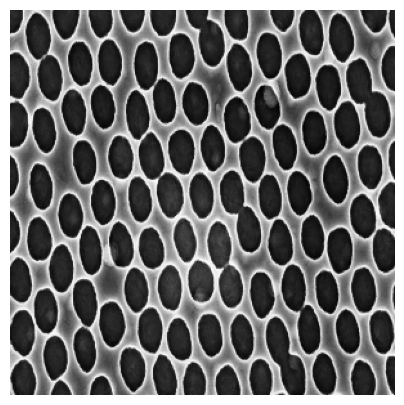

In [ ]:
img = np.load(ROOT / "img.npy")
img = torch.tensor(img, dtype=torch.float32)
plt.figure(figsize=(5, 5))
plt.imshow(img, cmap="gray")
plt.axis("off")
plt.show()

In [ ]:
def dipole_kernel(
    matrix_size: tuple[int, int],
    voxel_size: tuple[float, float] = (1.0, 1.0),
    B0_dir: tuple[float, float] = (0.0, 1.0),
) -> torch.Tensor:
    y = np.arange(-matrix_size[1] / 2, matrix_size[1] / 2, 1)
    x = np.arange(-matrix_size[0] / 2, matrix_size[0] / 2, 1)
    Y, X = np.meshgrid(y, x)

    X = X / (matrix_size[0] * voxel_size[0])
    Y = Y / (matrix_size[1] * voxel_size[1])

    D = 1 / 3 - (X * B0_dir[0] + Y * B0_dir[1]) ** 2 / (X**2 + Y**2 + 1e-8)
    D = np.fft.fftshift(D)
    D = torch.tensor(D, dtype=torch.float32)
    return D

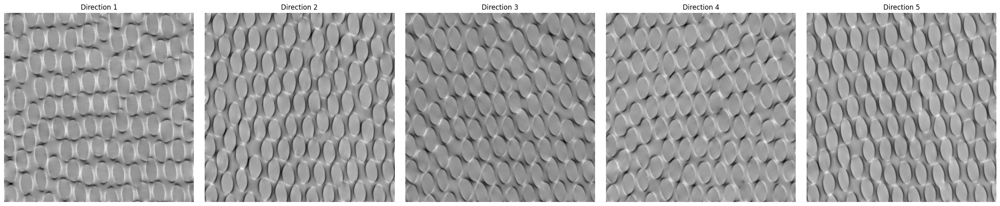

In [ ]:
num_dirs = 7
dirs = torch.arange(0, 2 * torch.pi, 2 * torch.pi / num_dirs, dtype=torch.float32)
dirs = torch.stack([torch.cos(dirs), torch.sin(dirs)], dim=-1)

img_shape = img.shape

kernels = torch.stack(
    [
        dipole_kernel(
            matrix_size=(img_shape[1], img_shape[0]),
            voxel_size=(1.0, 1.0),
            B0_dir=(d[0].item(), d[1].item()),
        )
        for d in dirs
    ],
    dim=0,
)

img_k = torch.fft.fftn(img, dim=(-2, -1))
imgs = torch.stack(
    [torch.fft.ifftn(img_k * kernel, dim=(-2, -1)).real for kernel in kernels], dim=0
)

plt.figure(figsize=(5 * num_dirs, 5))
for i in range(num_dirs):
    plt.subplot(1, num_dirs, i + 1)
    plt.imshow(imgs[i], cmap="gray")
    plt.title(f"Direction {i + 1}")
    plt.axis("off")
plt.tight_layout()
plt.show()

In [ ]:
imgs_k = torch.fft.fftn(imgs, dim=(-2, -1))
print("Shape of imgs_k:", imgs_k.shape)
recon_k = torch.zeros_like(img, dtype=torch.complex64)
H, W = img.shape[-2], img.shape[-1]
for i in range(H):
    for j in range(W):
        y = imgs_k[:, i, j]
        A = kernels[:, i, j].unsqueeze(1)
        A_inv = torch.linalg.pinv(A).squeeze().type(torch.complex64)
        recon_k[i, j] = torch.dot(A_inv, y)

recon = torch.fft.ifftn(recon_k, dim=(-2, -1)).real

Shape of imgs_k: torch.Size([5, 299, 299])


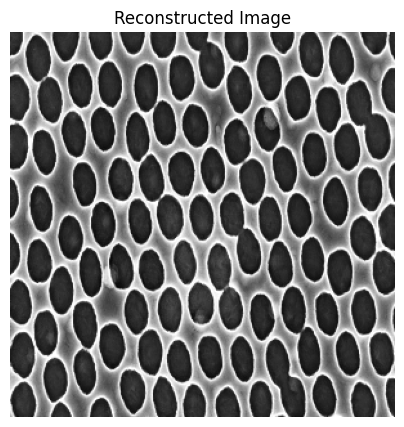

In [ ]:
vmax_label = np.percentile(img, 98) * 1.0
vmin = 0

plt.figure(figsize=(5, 5))
plt.imshow(recon, cmap="gray", vmin=vmin, vmax=vmax_label)
plt.title("Reconstructed Image")
plt.axis("off")
plt.show()

### Comparison of Reconstruction with Different Numbers of Orientations
We will compare the COSMOS reconstruction results using 1, 3, and 5 orientations, and visualize them alongside the original image and the error map (for the 5-orientation case).

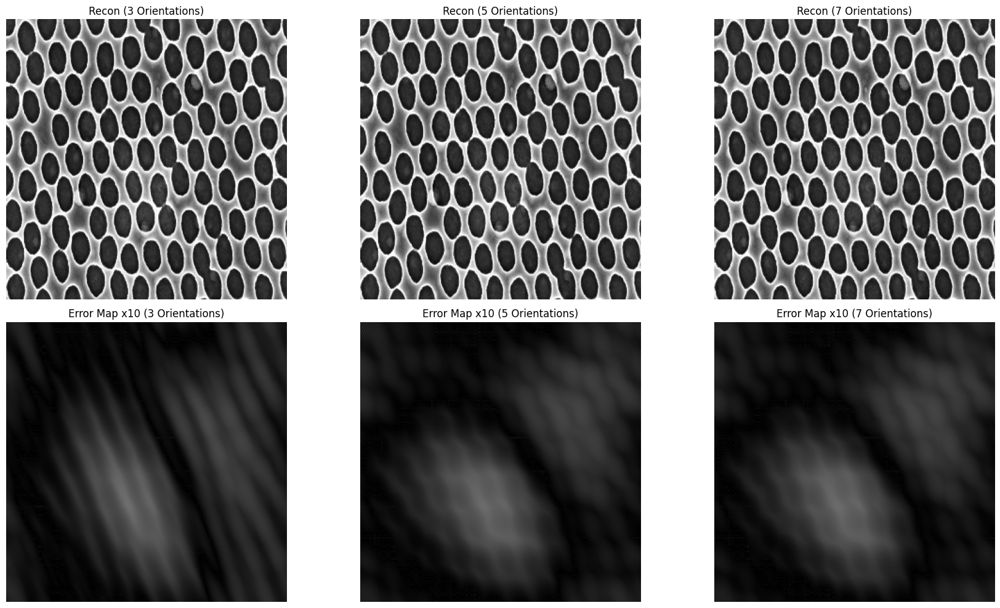

In [ ]:
def reconstruct_cosmos(n_orientations):
    y_subset = imgs_k[:n_orientations]
    A_subset = kernels[:n_orientations]
    H, W = img.shape
    recon_k_sub = torch.zeros((H, W), dtype=torch.complex64)
    for i in range(H):
        for j in range(W):
            y_vec = y_subset[:, i, j]
            A_mat = A_subset[:, i, j].unsqueeze(1)
            A_inv = torch.linalg.pinv(A_mat).type(torch.complex64)
            recon_k_sub[i, j] = torch.mm(A_inv, y_vec.unsqueeze(1)).squeeze()
    return torch.fft.ifftn(recon_k_sub, dim=(-2, -1)).real

recon_3 = reconstruct_cosmos(3)
recon_5 = reconstruct_cosmos(5)
recon_7 = reconstruct_cosmos(7)

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
recons = [recon_3, recon_5, recon_7]
titles = ["3 Orientations", "5 Orientations", "7 Orientations"]
for i in range(3):
    # Row 1: Reconstruction
    axes[0, i].imshow(recons[i], cmap='gray', vmin=0, vmax=vmax_label)
    axes[0, i].set_title(f"Recon ({titles[i]})")
    axes[0, i].axis('off')

    # Row 2: Error Map (*10, gray map, same vmin/vmax)
    err = torch.abs(img - recons[i]) * 10
    axes[1, i].imshow(err, cmap='gray', vmin=0, vmax=vmax_label)
    axes[1, i].set_title(f"Error Map x10 ({titles[i]})")
    axes[1, i].axis('off')

plt.tight_layout()
plt.show()

### Wiener Filter Reconstruction (Orientation 1)
Wiener filtering is used to stabilize the inversion when the kernel has values close to zero (null space).

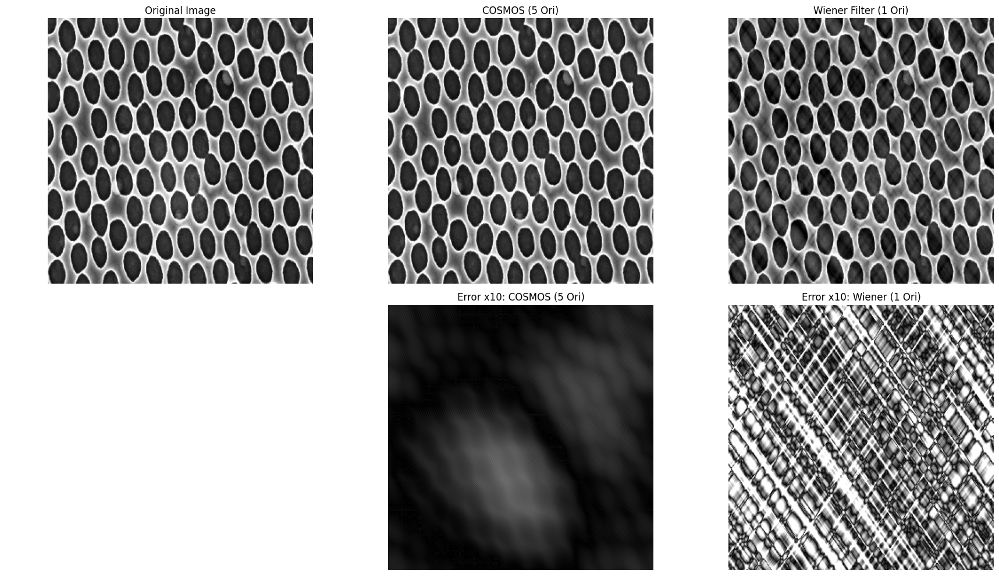

In [ ]:
def wiener_filter_recon(img_k_measured, kernel, noise_level=0.01):
    denominator = kernel.abs()**2 + noise_level
    recon_wiener_k = (img_k_measured * torch.conj(kernel)) / denominator
    return torch.fft.ifftn(recon_wiener_k, dim=(-2, -1)).real

recon_wiener = wiener_filter_recon(imgs_k[0], kernels[0], noise_level=1e-3)
err_cosmos = torch.abs(img - recon_5) * 10
err_wiener = torch.abs(img - recon_wiener) * 10

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Original Image
axes[0, 0].imshow(img, cmap='gray', vmin=0, vmax=vmax_label)
axes[0, 0].set_title("Original Image")
axes[1, 0].axis('off')

# COSMOS 5 Ori
axes[0, 1].imshow(recon_5, cmap='gray', vmin=0, vmax=vmax_label)
axes[0, 1].set_title("COSMOS (5 Ori)")
axes[1, 1].imshow(err_cosmos, cmap='gray', vmin=0, vmax=vmax_label)
axes[1, 1].set_title("Error x10: COSMOS (5 Ori)")

# Wiener 1 Ori
axes[0, 2].imshow(recon_wiener, cmap='gray', vmin=0, vmax=vmax_label)
axes[0, 2].set_title("Wiener Filter (1 Ori)")
axes[1, 2].imshow(err_wiener, cmap='gray', vmin=0, vmax=vmax_label)
axes[1, 2].set_title("Error x10: Wiener (1 Ori)")

for ax in axes.flatten():
    ax.axis('off')

plt.tight_layout()
plt.show()

### Reconstruction with Gaussian Noise (std=0.3)
We now simulate a more realistic scenario by adding Gaussian noise to the forward-calculated measurements.

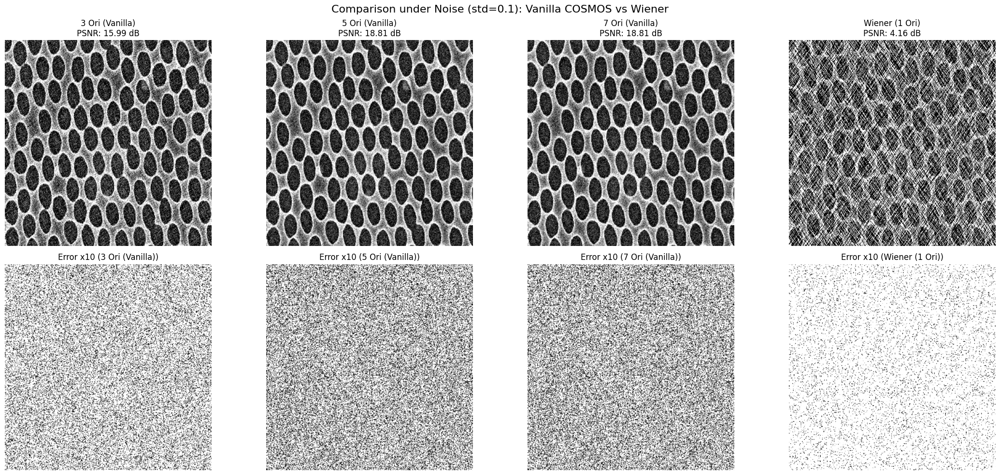

In [ ]:
import torch
import numpy as np

def calculate_psnr(img1, img2, max_val=1.0):
    mse = torch.mean((img1 - img2) ** 2)
    if mse == 0:
        return float('inf')
    return 20 * torch.log10(max_val / torch.sqrt(mse))

# 1. Generate Noisy Measurements
noise_std = 0.1
imgs_noisy = imgs + torch.randn_like(imgs) * noise_std
imgs_k_noisy = torch.fft.fftn(imgs_noisy, dim=(-2, -1))

# 2. Original COSMOS Recon (No Regularization)
def reconstruct_cosmos_vanilla(n_orientations, input_k):
    y_subset = input_k[:n_orientations]
    A_subset = kernels[:n_orientations]
    H, W = img.shape
    recon_k_sub = torch.zeros((H, W), dtype=torch.complex64)
    for i in range(H):
        for j in range(W):
            y_vec = y_subset[:, i, j]
            A_mat = A_subset[:, i, j].unsqueeze(1)
            A_inv = torch.linalg.pinv(A_mat).type(torch.complex64)
            recon_k_sub[i, j] = torch.mm(A_inv, y_vec.unsqueeze(1)).squeeze()
    return torch.fft.ifftn(recon_k_sub, dim=(-2, -1)).real

# Perform Vanilla Reconstructions
recon_3_v = reconstruct_cosmos_vanilla(3, imgs_k_noisy)
recon_5_v = reconstruct_cosmos_vanilla(5, imgs_k_noisy)
recon_7_v = reconstruct_cosmos_vanilla(7, imgs_k_noisy)
recon_wiener = wiener_filter_recon(imgs_k_noisy[0], kernels[0], noise_level=0.001)

# Visualization: Vanilla COSMOS vs Wiener
fig, axes = plt.subplots(2, 4, figsize=(22, 10))
recons = [recon_3_v, recon_5_v, recon_7_v, recon_wiener]
titles = ["3 Ori (Vanilla)", "5 Ori (Vanilla)", "7 Ori (Vanilla)", "Wiener (1 Ori)"]

for i in range(4):
    psnr_val = calculate_psnr(img, recons[i])
    axes[0, i].imshow(recons[i], cmap='gray', vmin=0, vmax=vmax_label)
    axes[0, i].set_title(f"{titles[i]}\nPSNR: {psnr_val:.2f} dB")
    axes[0, i].axis('off')

    err = torch.abs(img - recons[i]) * 10
    axes[1, i].imshow(err, cmap='gray', vmin=0, vmax=vmax_label)
    axes[1, i].set_title(f"Error x10 ({titles[i]})")
    axes[1, i].axis('off')

plt.suptitle(f"Comparison under Noise (std={noise_std}): Vanilla COSMOS vs Wiener", fontsize=16)
plt.tight_layout()
plt.show()

In [ ]:
print(f"Number of directions generated (num_dirs): {num_dirs}")
print(f"Shape of imgs tensor: {imgs.shape}")
print(f"Shape of imgs_k_noisy tensor: {imgs_k_noisy.shape}")

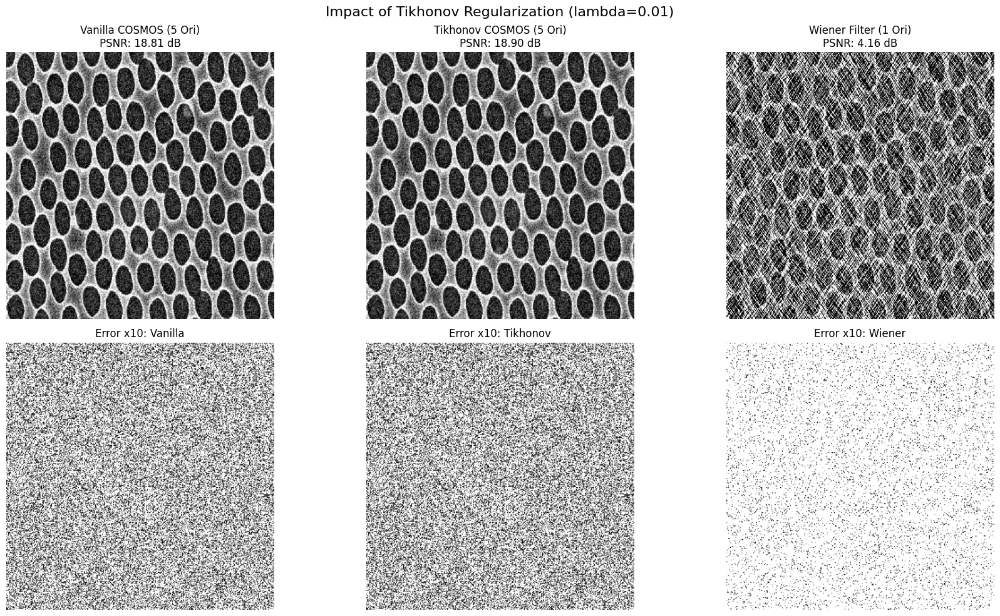

In [ ]:
# 3. Define Tikhonov Regularized COSMOS
def reconstruct_cosmos_tikhonov(n_orientations, input_k, reg_lambda=0.01):
    y_subset = input_k[:n_orientations]
    A_subset = kernels[:n_orientations]
    H, W = img.shape
    recon_k_sub = torch.zeros((H, W), dtype=torch.complex64)
    for i in range(H):
        for j in range(W):
            y_vec = y_subset[:, i, j]
            A_vec = A_subset[:, i, j]
            ata = torch.sum(torch.abs(A_vec)**2)
            aty = torch.sum(torch.conj(A_vec) * y_vec)
            recon_k_sub[i, j] = aty / (ata + reg_lambda)
    return torch.fft.ifftn(recon_k_sub, dim=(-2, -1)).real

reg_val = 0.01
recon_5_tik = reconstruct_cosmos_tikhonov(5, imgs_k_noisy, reg_lambda=reg_val)

# Final Comparison: Vanilla vs Tikhonov vs Wiener
psnr_v = calculate_psnr(img, recon_5_v)
psnr_t = calculate_psnr(img, recon_5_tik)
psnr_w = calculate_psnr(img, recon_wiener)

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Row 1: Images
axes[0, 0].imshow(recon_5_v, cmap='gray', vmin=0, vmax=vmax_label)
axes[0, 0].set_title(f"Vanilla COSMOS (5 Ori)\nPSNR: {psnr_v:.2f} dB")

axes[0, 1].imshow(recon_5_tik, cmap='gray', vmin=0, vmax=vmax_label)
axes[0, 1].set_title(f"Tikhonov COSMOS (5 Ori)\nPSNR: {psnr_t:.2f} dB")

axes[0, 2].imshow(recon_wiener, cmap='gray', vmin=0, vmax=vmax_label)
axes[0, 2].set_title(f"Wiener Filter (1 Ori)\nPSNR: {psnr_w:.2f} dB")

# Row 2: Errors
axes[1, 0].imshow(torch.abs(img - recon_5_v)*10, cmap='gray', vmin=0, vmax=vmax_label)
axes[1, 0].set_title("Error x10: Vanilla")

axes[1, 1].imshow(torch.abs(img - recon_5_tik)*10, cmap='gray', vmin=0, vmax=vmax_label)
axes[1, 1].set_title("Error x10: Tikhonov")

axes[1, 2].imshow(torch.abs(img - recon_wiener)*10, cmap='gray', vmin=0, vmax=vmax_label)
axes[1, 2].set_title("Error x10: Wiener")

for ax in axes.flatten(): ax.axis('off')
plt.suptitle(f"Impact of Tikhonov Regularization (lambda={reg_val})", fontsize=16)
plt.tight_layout()
plt.show()